# **Big Data and AI Project - Home Credit Default Risk Detection - Map Reducers**

### Note:Project Done using 25GB RAM and Runtime type set as GPU on Google Colab

## **Extracting datasets from Kaggle**

In [1]:
#Importing Home Credit Default Risk Kaggle datasets
!pip install kaggle
!kaggle
with open("/root/.kaggle/kaggle.json","w") as fp:
  info = '{"username":"shashankmanurao","key":"52eb38fb5caedc18eda01c110d1022db"}'
  fp.write(info)
!kaggle competitions download -c home-credit-default-risk

usage: kaggle [-h] [-v] {competitions,c,datasets,d,kernels,k,config} ...
kaggle: error: too few arguments
installments_payments.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
previous_application.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
POS_CASH_balance.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
HomeCredit_columns_description.csv: Skipping, found more recently modified local copy (use --force to force download)
application_test.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
credit_card_balance.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
bureau.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
bureau_balance.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
application_train.cs

In [2]:
#Viewing list of files present
! ls

appDF_final3.csv	     HomeCredit_columns_description.csv
application_test.csv.zip     installments_payments.csv.zip
application_train.csv.zip    POS_CASH_balance.csv.zip
bureau_balance.csv.zip	     previous_application.csv.zip
bureau.csv.zip		     sample_data
credit_card_balance.csv.zip  sample_submission.csv
drive


## **Transforming datasets into .csv format**

In [3]:
#Unzipping necessary datasets
!unzip application_train.csv.zip
!unzip bureau_balance.csv.zip
!unzip bureau.csv.zip
!unzip credit_card_balance.csv.zip
!unzip installments_payments.csv.zip
!unzip POS_CASH_balance.csv.zip
!unzip previous_application.csv.zip

Archive:  application_train.csv.zip
  inflating: application_train.csv   
Archive:  bureau_balance.csv.zip
  inflating: bureau_balance.csv      
Archive:  bureau.csv.zip
  inflating: bureau.csv              
Archive:  credit_card_balance.csv.zip
  inflating: credit_card_balance.csv  
Archive:  installments_payments.csv.zip
  inflating: installments_payments.csv  
Archive:  POS_CASH_balance.csv.zip
  inflating: POS_CASH_balance.csv    
Archive:  previous_application.csv.zip
  inflating: previous_application.csv  


In [4]:
#Mounting drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Storing datasets for future use**

In [0]:
#Copying all datasets to drive
!cp application_train.csv /content/drive/My\ Drive/Colab\ Notebooks
!cp bureau_balance.csv /content/drive/My\ Drive/Colab\ Notebooks
!cp bureau.csv /content/drive/My\ Drive/Colab\ Notebooks
!cp credit_card_balance.csv /content/drive/My\ Drive/Colab\ Notebooks
!cp installments_payments.csv /content/drive/My\ Drive/Colab\ Notebooks
!cp POS_CASH_balance.csv /content/drive/My\ Drive/Colab\ Notebooks
!cp previous_application.csv /content/drive/My\ Drive/Colab\ Notebooks

In [5]:
#Importing libraries
import numpy as np
import pandas as pd 
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from statistics import mode
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from timeit import default_timer as timer
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint
from xgboost import XGBClassifier
from xgboost import plot_importance

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Loading datasets as dataframes

In [0]:
# Read the full datasets as pandas dataframes
app = pd.read_csv('drive/My Drive/Colab Notebooks/application_train.csv')
bureau = pd.read_csv('drive/My Drive/Colab Notebooks/bureau.csv')
bureau_balance = pd.read_csv('drive/My Drive/Colab Notebooks/bureau_balance.csv')
cash = pd.read_csv('drive/My Drive/Colab Notebooks/POS_CASH_balance.csv')
credit = pd.read_csv('drive/My Drive/Colab Notebooks/credit_card_balance.csv')
previous = pd.read_csv('drive/My Drive/Colab Notebooks/previous_application.csv')
installments = pd.read_csv('drive/My Drive/Colab Notebooks/installments_payments.csv')

print('Read all datasets')

Read all datasets


In [0]:
#Converting type of primary ID columns to string
app['SK_ID_CURR']=app['SK_ID_CURR'].astype('str')
bureau[['SK_ID_CURR','SK_ID_BUREAU']]=bureau[['SK_ID_CURR','SK_ID_BUREAU']].astype('str')
bureau_balance['SK_ID_BUREAU']=bureau_balance['SK_ID_BUREAU'].astype('str')
cash[['SK_ID_PREV','SK_ID_CURR']]=cash[['SK_ID_PREV','SK_ID_CURR']].astype('str')
previous[['SK_ID_PREV','SK_ID_CURR']]=previous[['SK_ID_PREV','SK_ID_CURR']].astype('str')
credit[['SK_ID_PREV','SK_ID_CURR']]=credit[['SK_ID_PREV','SK_ID_CURR']].astype('str')
installments[['SK_ID_PREV','SK_ID_CURR']]=installments[['SK_ID_PREV','SK_ID_CURR']].astype('str')

## **Exploratory Data Analysis**

In [0]:
app.head() #view head of app entity

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,...,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,...,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
bureau.head() #view head of bureau entity

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [0]:
bureau_balance.head() #view head of bureau_balance entity

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [0]:
cash.head() #view head of cash entity

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [0]:
previous.head() #view head of previous entity

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
credit.head() #view head of credit entity

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [0]:
installments.head() #view head of installments entity

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


### **1.Effect of age on repayment**

For this, we would first like to see the frequency distribution of age of all current applicants.

In [0]:
app['CODE_AGE']=(-1*app['DAYS_BIRTH'])/365
# Plotting the histogram
fig = px.histogram(app, x="CODE_AGE", nbins=25)
fig.show()

We would further like to see how the distribution of age between genders.

In [0]:
fig1 = px.histogram(app, x="CODE_AGE", color = "CODE_GENDER", nbins=25)
fig1.show()

Now, let's plot the relationship between age and the target variable. 

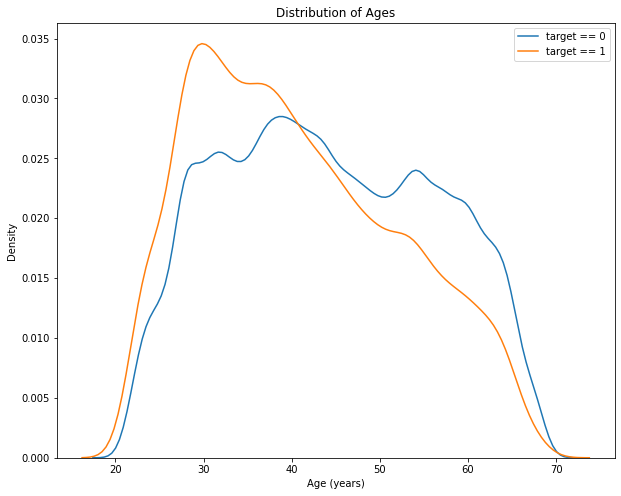

In [0]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app.loc[app['TARGET'] == 0, 'CODE_AGE'], label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app.loc[app['TARGET'] == 1, 'CODE_AGE'] , label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

In [0]:
# Age information into a separate dataframe
age_data = app.loc[:,['TARGET']]
age_data['CODE_AGE'] = app['CODE_AGE']

# Bin the age data
age_data['AGE_BINNED'] = pd.cut(age_data['CODE_AGE'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,CODE_AGE,AGE_BINNED
0,1,25.920548,"(25.0, 30.0]"
1,0,45.931507,"(45.0, 50.0]"
2,0,52.180822,"(50.0, 55.0]"
3,0,52.068493,"(50.0, 55.0]"
4,0,54.608219,"(50.0, 55.0]"
5,0,46.413699,"(45.0, 50.0]"
6,0,37.747945,"(35.0, 40.0]"
7,0,51.643836,"(50.0, 55.0]"
8,0,55.065753,"(55.0, 60.0]"
9,0,39.641096,"(35.0, 40.0]"


In [0]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('AGE_BINNED').mean()
age_groups

,TARGET,CODE_AGE
AGE_BINNED,,
"(20.0, 25.0]",0.123036,23.377522
"(25.0, 30.0]",0.111436,27.822518
"(30.0, 35.0]",0.102814,32.479037
"(35.0, 40.0]",0.089414,37.555913
"(40.0, 45.0]",0.078491,42.459346
"(45.0, 50.0]",0.074171,47.462741
"(50.0, 55.0]",0.066968,52.593136
"(55.0, 60.0]",0.055314,57.491131
"(60.0, 65.0]",0.052737,62.412459


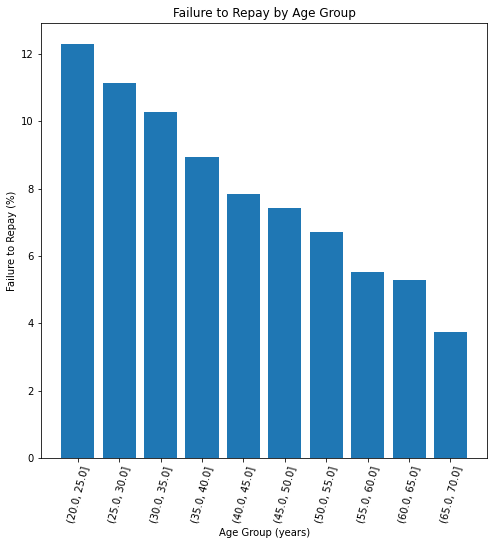

In [0]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

#### Insight:
There is a clear trend: younger applicants are more likely to not repay the loan! The rate of failure to repay is above 10% for the youngest three age groups and below 5% for the oldest age group.

### 2**.Housing Type Frequencies**

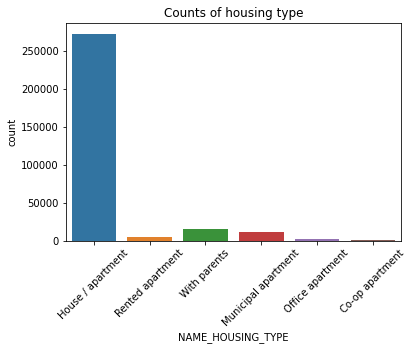

In [0]:
#Plotting frequencies of types of houses
sns.countplot(app['NAME_HOUSING_TYPE']);
plt.xticks(rotation=45);
plt.title('Counts of housing type')
plt.show()

#### **Insight:** 
Most people are looking to buy a House/apartment

### **3.Contact information**
There are 6 features showing that client provided some contact information, let's see how many ways of contact clients usually provide.

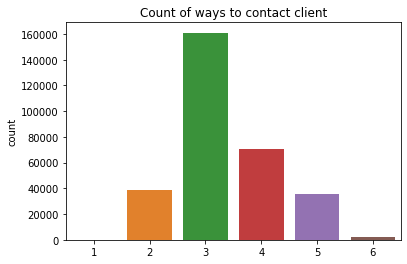

In [0]:
contact_info = app['FLAG_MOBIL'] + app['FLAG_EMP_PHONE'] + app['FLAG_WORK_PHONE'] + app['FLAG_CONT_MOBILE'] + app['FLAG_PHONE'] + app['FLAG_EMAIL']
sns.countplot(contact_info);
plt.title('Count of ways to contact client');

#### Insight: 
Most clients provide 3 ways to contact them and usually minimum is 2, if we don't consider several people who left only 1.

### **4.Amount Credit Plots**

In [0]:
fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=app['AMT_CREDIT']))
fig.update_layout(
    yaxis_title='AMT_CREDIT'
)

The data is severely skewed by outliers. So let's consider only the values within 90 percentile.

In [0]:
fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(
    x=app[app['AMT_CREDIT'] < np.percentile(app['AMT_CREDIT'], 95)]['AMT_CREDIT'],
    marker_color='#3D9970'   
    ))
fig.update_layout(
    yaxis_title='AMT_DATA within 90 percentile'
)

#### **Insight:**
Hovering over the interactive plot tells us the summary statistics for the final credit extended to the client. The median is 491,211 $

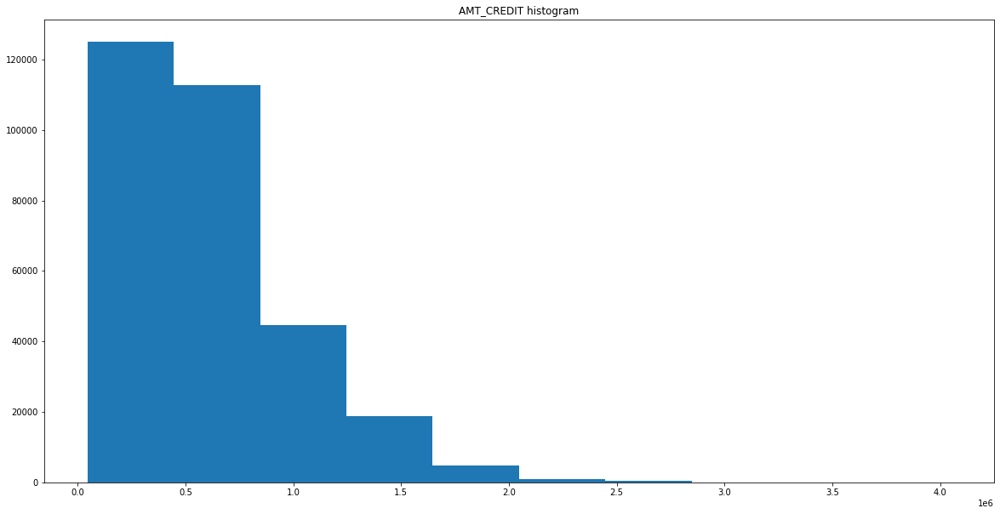

In [0]:
plt.figure(figsize=(20,10))
plt.hist(app['AMT_CREDIT']);
plt.title('AMT_CREDIT histogram');

###  **5.Duration of credit**

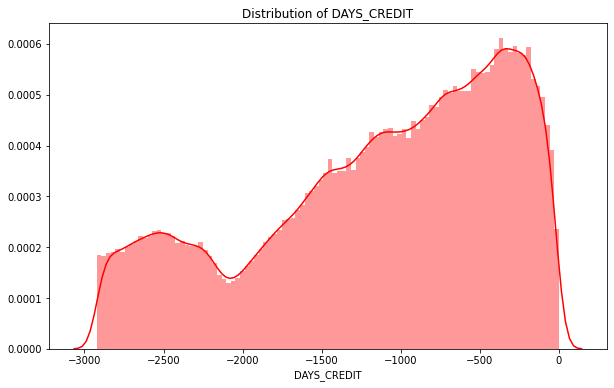

In [0]:
plt.figure(figsize=(10,6))
plt.title("Distribution of %s" % 'DAYS_CREDIT')
sns.distplot(bureau['DAYS_CREDIT'].dropna(),color='red', kde=True,bins=100)
plt.show() 

#### **Insight:**
Distribution of Duration between Credit Loan Application and Home Credit Application is ranging between 3000 days to 0 days, with an increasing frequency for shorter number of days - a peak at around 300 days (or less than one year).

### **6.Credit Overdue**


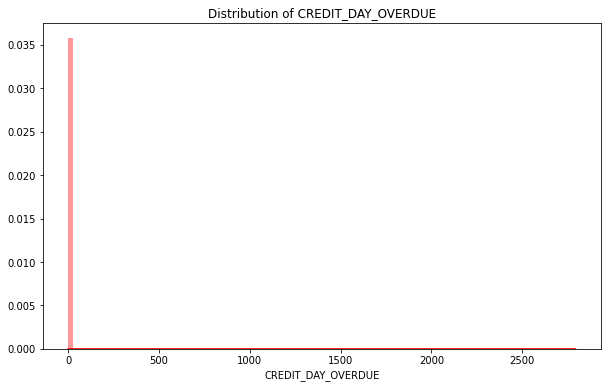

In [0]:
plt.figure(figsize=(10,6))
plt.title("Distribution of %s" % 'CREDIT_DAY_OVERDUE')
sns.distplot(bureau['CREDIT_DAY_OVERDUE'].dropna(),color='red', kde=True,bins=100)
plt.show() 


#### Insight:
Most of the credits have 0 or close to 0 days overdue. The maximum number of credit days overdue is ~3000 days.

### **7.Days Employed**

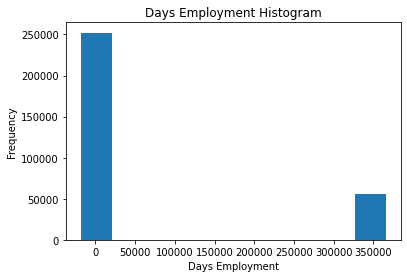

In [0]:
app['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

### **8.Days First drawing**

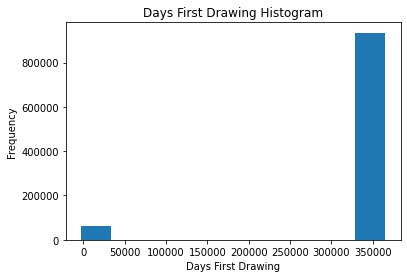

In [0]:
previous['DAYS_FIRST_DRAWING'].plot.hist(title = 'Days First Drawing Histogram');
plt.xlabel('Days First Drawing');

#### **Insight:**
As we can see from the above two plots, there are outlier values which need to be removed

In [0]:
#Removing outliers
app=app.replace({365243: np.nan})
previous=previous.replace({365243: np.nan})

### 9.Education Type


Let's explore what are the educational backgrounds that are more popular among the loan applicants. 


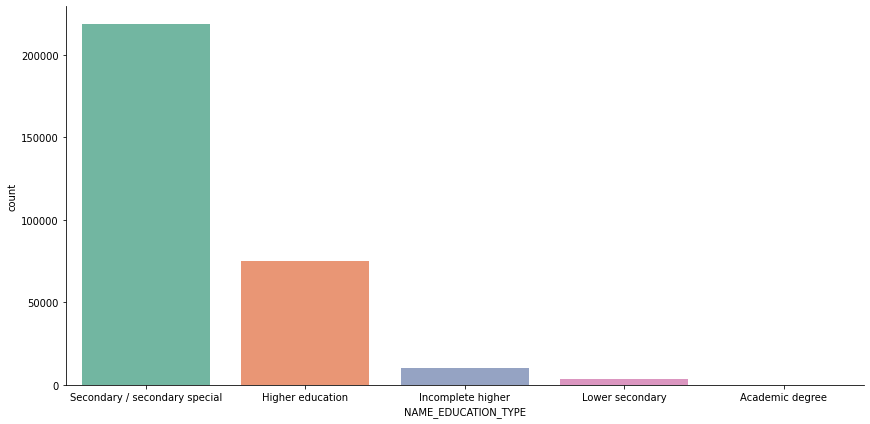

In [0]:
g = sns.catplot(x="NAME_EDUCATION_TYPE", 
                data=app, kind = 'count',
                height=6, aspect=2, palette = "Set2", ci=None)

#### **Insight:**
Most applicants had completed a high level of Special Education like Bacheor's/Master's/PhD

And let's see how education type has an influence on the target variable.

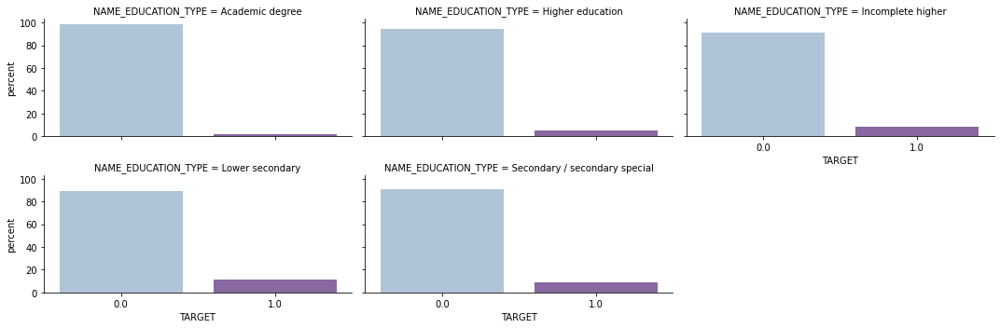

In [0]:
x,y = 'NAME_EDUCATION_TYPE', 'TARGET'

df1 = app.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x="TARGET", y="percent", col="NAME_EDUCATION_TYPE", col_wrap=3,
                data=df1, kind = 'bar',
                height=2.5, aspect=2, palette = "BuPu", ci=None)

### **10.Income Type**

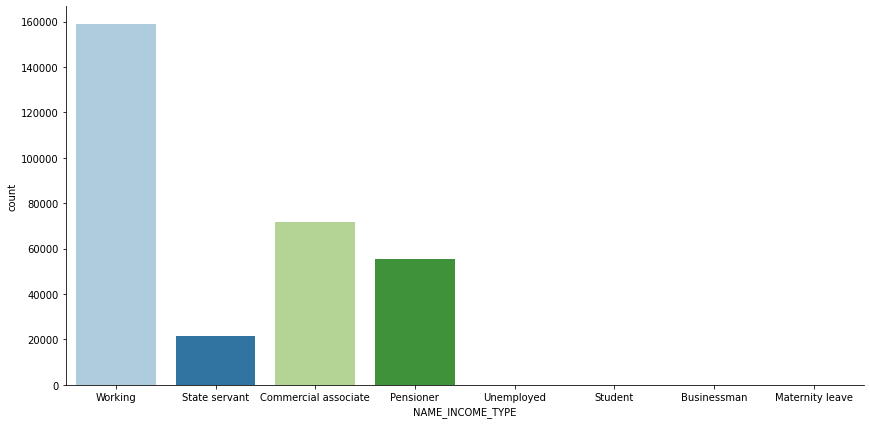

In [0]:
g = sns.catplot(x="NAME_INCOME_TYPE", 
                data=app, kind = 'count',
                height=6, aspect=2, palette = "Paired", ci=None)

Income Type Vs Target

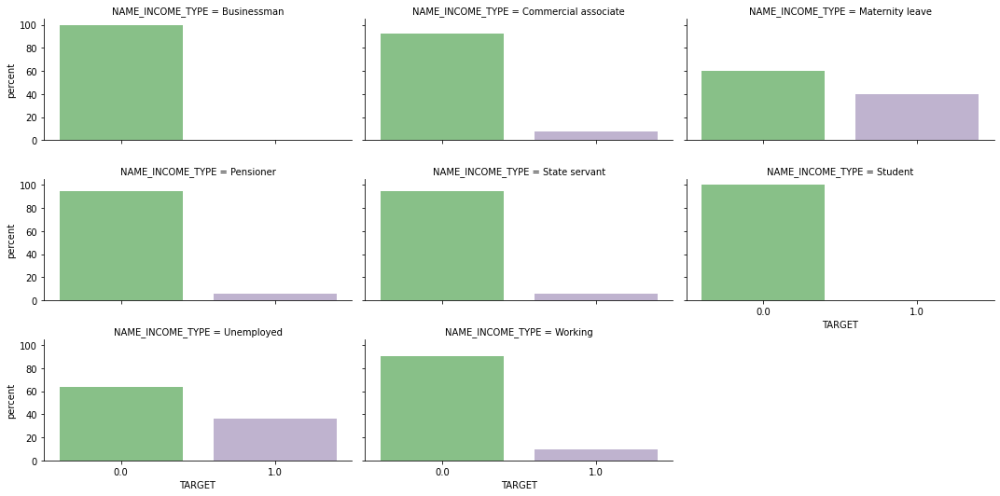

In [0]:
x,y = 'NAME_INCOME_TYPE', 'TARGET'

df1 = app.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x="TARGET", y="percent", col="NAME_INCOME_TYPE", col_wrap=3,
                data=df1, kind = 'bar',
                height=2.5, aspect=2, palette = "Accent", ci=None)

#### **Insight:**
The percentage is higher for people in maternity leave and those who are unemployed.  

### **11.Occupation Type**

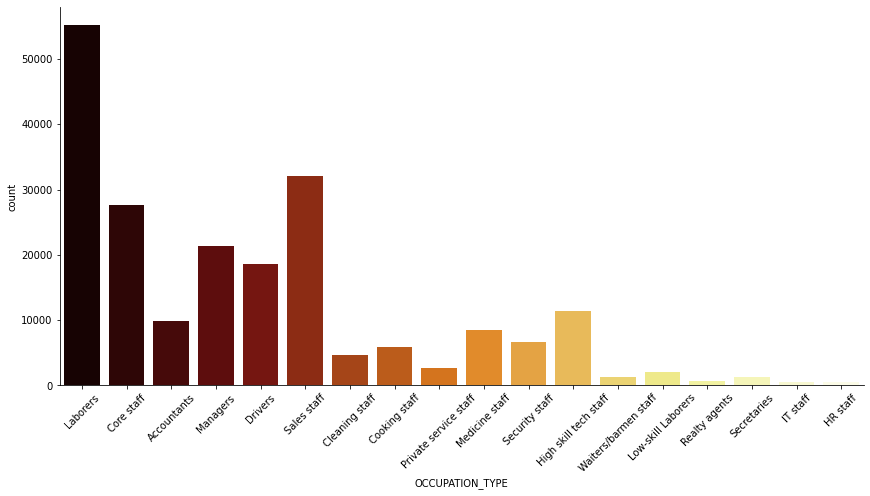

In [0]:
g = sns.catplot(x="OCCUPATION_TYPE", 
                data=app, kind = 'count',
                height=6, aspect=2, palette = "afmhot", ci=None)
plt.xticks(rotation=45);

#### **Insight:**
Most Applicants were Laborers or Sales staff

And how the target responds to occupation type..

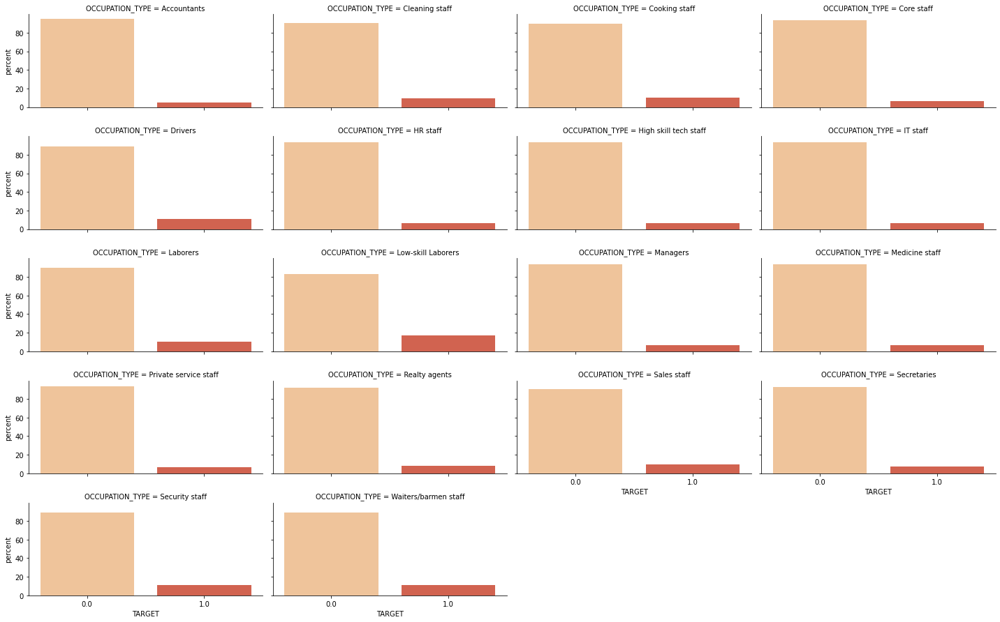

In [0]:
x,y = 'OCCUPATION_TYPE', 'TARGET'

df1 = app.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x="TARGET", y="percent", col="OCCUPATION_TYPE", col_wrap=4,
                data=df1, kind = 'bar',
                height=2.5, aspect=2, palette = "OrRd", ci=None)

### **12.Number of Family Members**

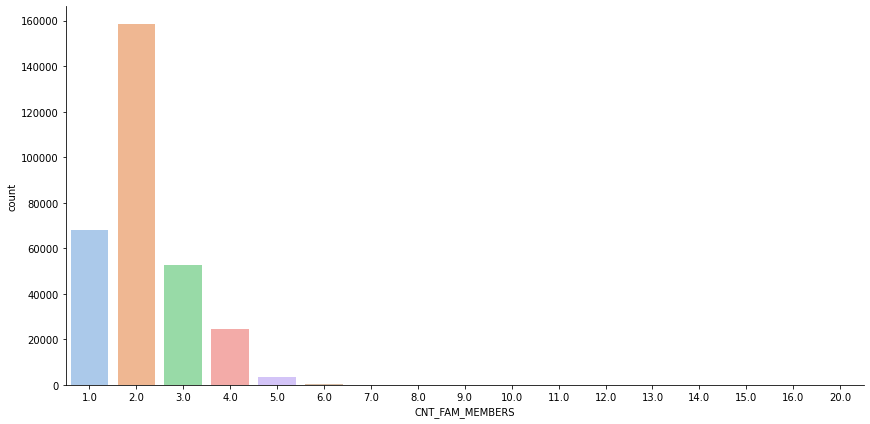

In [0]:
# Frequency Distribution

g = sns.catplot(x="CNT_FAM_MEMBERS", 
                data=app, kind = 'count',
                height=6, aspect=2, palette = "pastel", ci=None)

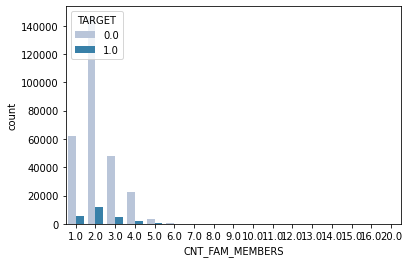

In [0]:
ax = sns.countplot(x="CNT_FAM_MEMBERS", hue="TARGET", data=app, palette = "PuBu")

#### **Insight:**
Most applicants had a family size of just 2 members !

### **13.Number of Children**

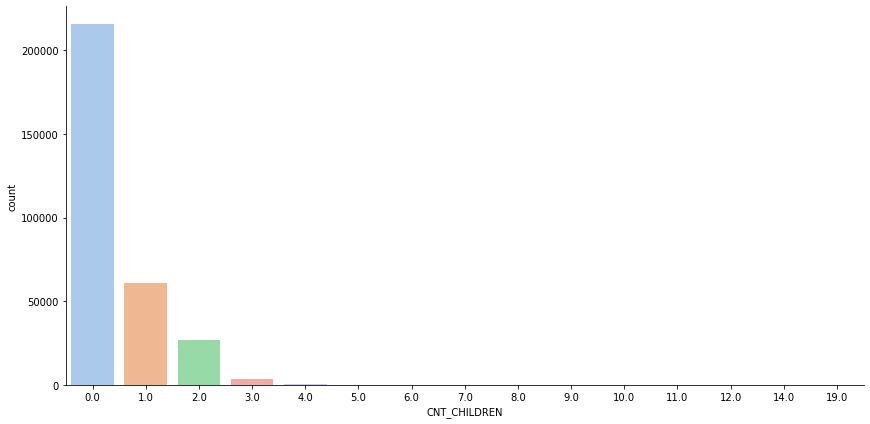

In [0]:
g = sns.catplot(x="CNT_CHILDREN", 
                data=app, kind = 'count',
                height=6, aspect=2, palette = "pastel", ci=None)

#### **Insight:**
Most people had 0 children. This makes sense given that the most common family size is just 2.

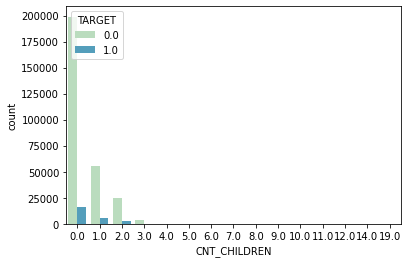

In [0]:
ax = sns.countplot(x="CNT_CHILDREN", hue="TARGET", data=app, palette = "GnBu")

## **User Defined Functions**

In [0]:
#Function to check percentage of missing rows
def missing(df, threshold = 50):
    # Calculate missing stats 
    miss = pd.DataFrame(df.isnull().sum())
    miss['percent'] = 100 * miss[0] / len(df)
        
    # list of missing columns
    missing_columns = (miss[miss['percent']>threshold])
    return missing_columns

In [12]:
#Checking percentage of missing rows in dataset PREVIOUS
missing(previous,threshold=90)

,0,percent
RATE_INTEREST_PRIMARY,1664263,99.643698
RATE_INTEREST_PRIVILEGED,1664263,99.643698
DAYS_FIRST_DRAWING,1607509,96.245691


In [0]:
#Dropping high percentage null columns
previous=previous.drop(columns=["RATE_INTEREST_PRIMARY","RATE_INTEREST_PRIVILEGED","DAYS_FIRST_DRAWING"])

In [0]:
#Function to aggregate secondary datasets
def agg2(df, parent_var, df_name):  
    
    # Remove id variables other than grouping variable
    for col in df.columns:
        if col != parent_var and 'SK_ID' in col:
            df = df.drop(columns = col)
    
    # Only want the numeric variables
    numeric_df = df.select_dtypes(include=['float','int','double']).copy()
    if numeric_df.shape[1] != 0:
        numeric_df[parent_var] = df[parent_var]
    # Group by the specified variable and calculate the statistics
        agg_df = numeric_df.groupby(parent_var).agg(['count', 'mean', 'max', 'min', 'sum'])
    
        columns = []

    # Iterate through the variables names
        for var in agg_df.columns.levels[0]:
            if var != parent_var:
            # Iterate through the stat names
                for stat in agg_df.columns.levels[1]:
                # Make a new column name for the variable and stat
                    columns.append('%s_%s_%s' % (df_name, var, stat))
    
        agg_df.columns = columns
    # Select the categorical columns
    catdata = df.select_dtypes(['category','object','bool'])
    if parent_var in catdata.columns:
        catdata=catdata.drop(columns = parent_var)
    
    if catdata.shape[1] != 0:
        
        categorical = pd.get_dummies(catdata)
        
        # Make sure to put the identifying id on the column
        categorical[parent_var] = df[parent_var]
        
        # Groupby the group var and calculate the sum and mean
        categorical = categorical.groupby(parent_var).agg(['sum', 'count', 'mean'])
        
        column_names = []
    
        # Iterate through the columns in level 0
        for var1 in categorical.columns.levels[0]:
            if var1 != parent_var:
                # Iterate through the stats in level 1
                for stat1 in ['sum', 'count', 'mean']:
                    # Make a new column name
                    column_names.append('%s_%s_%s' % (df_name, var1, stat1))
        categorical.columns=column_names
        if numeric_df.shape[1] == 0:
          agg_df1=categorical
        else:
          # Merge on the parent variable
          agg_df1 = agg_df.merge(categorical, on=parent_var, how = 'outer')
    else:
        agg_df1=agg_df   
    
    # Remove the columns with all redundant values
    _, idx = np.unique(agg_df1, axis = 1, return_index=True)
    agg_df1 = agg_df1.iloc[:, idx]
    
    return agg_df1

In [0]:
#Function to call aggregation function and merge aggregated datasets to main dataset
def agg_subset(df, parent_var, df_name, parent_df=None, grandparent_var=None):
    """Aggregate a grandchild dataframe at the grandparent level."""
    if parent_df is None and grandparent_var is None :
        return agg2(df, parent_var, df_name)
    else:
    # set the parent_var as the index of the parent_df for faster merges
        parent_df = parent_df[[parent_var, grandparent_var]].copy().set_index(parent_var)
        
    # Aggregate the numeric variables at the parent level
        df_agg = agg2(df, parent_var, '%s_LOAN' % df_name)
    
    # Merge to get the grandparent variable in the data
        df_agg = df_agg.merge(parent_df, 
                          on = parent_var, how = 'left')
    
    # Aggregate the numeric variables at the grandparent level
        df_info = agg2(df_agg, grandparent_var, '%s_CLIENT' % df_name)
    
  
        gc.enable()
        del df_agg
        gc.collect()
    
    # Drop the columns with all duplicated values
        _, idx = np.unique(df_info, axis = 1, return_index=True)
        df_info = df_info.iloc[:, idx]
    
        return df_info

In [0]:
#Function to calculate True Positive Rate,False Negative Rate,True Negative Rate and False Positive Rate
def metric(cm):
  TPR=cm[1][1]/(cm[1][0]+cm[1][1])
  FNR=cm[1][0]/(cm[1][0]+cm[1][1])
  TNR=cm[0][0]/(cm[0][0]+cm[0][1])
  FPR=cm[0][1]/(cm[0][0]+cm[0][1])
  return [TPR,FNR,TNR,FPR]

## **Custom features - Manual Feature Engineering**

In [0]:
#Customized features
app['LOAN_RATE'] = app['AMT_ANNUITY'] / app['AMT_CREDIT'] 
app['CREDIT_INCOME_RATIO'] = app['AMT_CREDIT'] / app['AMT_INCOME_TOTAL']
app['EMPLOYED_BIRTH_RATIO'] = app['DAYS_EMPLOYED'] / app['DAYS_BIRTH']
app['EXT_SOURCE_SUM'] = app[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].sum(axis = 1)
app['EXT_SOURCE_MEAN'] = app[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis = 1)
app['AMT_REQ_SUM'] = app[[x for x in app.columns if 'AMT_REQ_' in x]].sum(axis = 1)

bureau['LOAN_RATE'] = bureau['AMT_ANNUITY'] / bureau['AMT_CREDIT_SUM']

bureau_balance['PAST_DUE'] = bureau_balance['STATUS'].isin(['1', '2', '3', '4', '5'])
bureau_balance['ON_TIME'] = bureau_balance['STATUS'] == '0'

previous['LOAN_RATE'] = previous['AMT_ANNUITY'] / previous['AMT_CREDIT']
previous["AMT_DIFFERENCE"] = previous['AMT_CREDIT'] - previous['AMT_APPLICATION']

installments['LATE'] = installments['DAYS_ENTRY_PAYMENT'] > installments['DAYS_INSTALMENT']
installments['LOW_PAYMENT'] = installments['AMT_PAYMENT'] < installments['AMT_INSTALMENT']

cash['LATE_PAYMENT'] = cash['SK_DPD'] > 0.0
cash['INSTALLMENTS_PAID'] = cash['CNT_INSTALMENT'] - cash['CNT_INSTALMENT_FUTURE']

credit['OVER_LIMIT'] = credit['AMT_BALANCE'] > credit['AMT_CREDIT_LIMIT_ACTUAL']
credit['BALANCE_CLEARED'] = credit['AMT_BALANCE'] == 0.0
credit['LOW_PAYMENT'] = credit['AMT_PAYMENT_CURRENT'] < credit['AMT_INST_MIN_REGULARITY']
credit['LATE'] = credit['SK_DPD'] > 0.0

## **Converting number of days/months columns to dates**

In [18]:
#Converting days columns of bureau dataframe to timedelta
for col in ['DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'DAYS_CREDIT_UPDATE']:
    bureau[col] = pd.to_timedelta(bureau[col], 'D')
    
bureau[['DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'DAYS_CREDIT_UPDATE']].head()

,DAYS_CREDIT,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,DAYS_CREDIT_UPDATE
0,-497 days,-153 days,-153 days,-131 days
1,-208 days,1075 days,NaT,-20 days
2,-203 days,528 days,NaT,-16 days
3,-203 days,NaT,NaT,-16 days
4,-629 days,1197 days,NaT,-21 days


In [19]:
# Establish a starting date for all applications at Home Credit
start_date = pd.Timestamp("2020-04-20")
start_date

Timestamp('2020-04-20 00:00:00')

In [0]:
# Create the date columns for bureau
bureau['bureau_credit_application_date'] = start_date + bureau['DAYS_CREDIT']
bureau['bureau_credit_end_date'] = start_date + bureau['DAYS_CREDIT_ENDDATE']
bureau['bureau_credit_close_date'] = start_date + bureau['DAYS_ENDDATE_FACT']
bureau['bureau_credit_update_date'] = start_date + bureau['DAYS_CREDIT_UPDATE']
# Drop the time offset columns
bureau = bureau.drop(columns = ['DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'DAYS_CREDIT_UPDATE'])

In [0]:
# Convert to timedelta
bureau_balance['MONTHS_BALANCE'] = pd.to_timedelta(bureau_balance['MONTHS_BALANCE'], 'D')
# Make a date column
bureau_balance['bureau_balance_date'] = start_date + bureau_balance['MONTHS_BALANCE']
# Drop the time offset columns
bureau_balance = bureau_balance.drop(columns = ['MONTHS_BALANCE'])

In [0]:
# Convert to timedelta
for col in ['DAYS_DECISION', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']:
    previous[col] = pd.to_timedelta(previous[col], 'D')
    
# Make date columns
previous['previous_decision_date'] = start_date + previous['DAYS_DECISION']
previous['previous_first_due_date'] = start_date + previous['DAYS_FIRST_DUE']
previous['previous_last_duefirst_date'] = start_date + previous['DAYS_LAST_DUE_1ST_VERSION']
previous['previous_last_due_date'] = start_date + previous['DAYS_LAST_DUE']
previous['previous_termination_date'] = start_date + previous['DAYS_TERMINATION']

# Drop the time offset columns
previous = previous.drop(columns = ['DAYS_DECISION', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION'])

In [0]:
# Convert to timedelta objects
credit['MONTHS_BALANCE'] = pd.to_timedelta(credit['MONTHS_BALANCE'], 'D')
cash['MONTHS_BALANCE'] = pd.to_timedelta(cash['MONTHS_BALANCE'], 'D')

# Make a date column
credit['credit_balance_date'] = start_date + credit['MONTHS_BALANCE']
credit = credit.drop(columns = ['MONTHS_BALANCE'])

# Make a date column
cash['cash_balance_date'] = start_date + cash['MONTHS_BALANCE']
cash = cash.drop(columns = ['MONTHS_BALANCE'])

# Convert to time delta object
installments['DAYS_INSTALMENT'] = pd.to_timedelta(installments['DAYS_INSTALMENT'], 'D')
installments['DAYS_ENTRY_PAYMENT'] = pd.to_timedelta(installments['DAYS_ENTRY_PAYMENT'], 'D')

# Create time column and drop
installments['installments_due_date'] = start_date + installments['DAYS_INSTALMENT']
installments = installments.drop(columns = ['DAYS_INSTALMENT'])

installments['installments_paid_date'] = start_date + installments['DAYS_ENTRY_PAYMENT']
installments = installments.drop(columns = ['DAYS_ENTRY_PAYMENT'])

## **Converting categorical columns of APPLICATION dataframe to dummy variables**

In [24]:
#One hot encode application dataframe columns
app = app.set_index('SK_ID_CURR')
cat=app.select_dtypes(['object','category'])
category=pd.get_dummies(cat)
app=app.drop(app.select_dtypes(['object','category']).columns,axis=1)
app=app.merge(category,on="SK_ID_CURR",how='left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA,FONDKAPREMONT_MODE_not specified,FONDKAPREMONT_MODE_org spec account,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
100006,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,-9833.0,-2437.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
100007,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,-4311.0,-3458.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,1.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,1.0,1.0,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## **Aggregating and Merging datasets**

In [25]:
#Aggregating bureau dataframe
bureau_info = agg_subset(df=bureau, parent_var='SK_ID_CURR', df_name='BUREAU')
bureau_info.head()

,BUREAU_CREDIT_TYPE_Mobile operator loan_mean,BUREAU_CREDIT_TYPE_Mobile operator loan_sum,BUREAU_CREDIT_TYPE_Loan for purchase of shares (margin lending)_mean,BUREAU_CREDIT_TYPE_Loan for purchase of shares (margin lending)_sum,BUREAU_CREDIT_ACTIVE_Bad debt_mean,BUREAU_CREDIT_ACTIVE_Bad debt_sum,BUREAU_CREDIT_TYPE_Interbank credit_mean,BUREAU_CREDIT_TYPE_Interbank credit_sum,BUREAU_CREDIT_TYPE_Real estate loan_mean,BUREAU_CREDIT_TYPE_Real estate loan_sum,BUREAU_CREDIT_CURRENCY_currency 4_mean,BUREAU_CREDIT_CURRENCY_currency 4_sum,BUREAU_CREDIT_CURRENCY_currency 3_mean,BUREAU_CREDIT_CURRENCY_currency 3_sum,BUREAU_CREDIT_TYPE_Loan for the purchase of equipment_mean,BUREAU_CREDIT_TYPE_Loan for the purchase of equipment_sum,BUREAU_CREDIT_TYPE_Cash loan (non-earmarked)_mean,BUREAU_CREDIT_TYPE_Cash loan (non-earmarked)_sum,BUREAU_CREDIT_TYPE_Unknown type of loan_mean,BUREAU_CREDIT_TYPE_Unknown type of loan_sum,BUREAU_CREDIT_TYPE_Another type of loan_mean,BUREAU_CREDIT_TYPE_Another type of loan_sum,BUREAU_CNT_CREDIT_PROLONG_min,BUREAU_CREDIT_DAY_OVERDUE_min,BUREAU_AMT_CREDIT_SUM_OVERDUE_min,BUREAU_CREDIT_TYPE_Loan for working capital replenishment_mean,BUREAU_CREDIT_TYPE_Loan for working capital replenishment_sum,BUREAU_CREDIT_CURRENCY_currency 2_mean,BUREAU_CREDIT_CURRENCY_currency 2_sum,BUREAU_CREDIT_DAY_OVERDUE_mean,BUREAU_CREDIT_DAY_OVERDUE_max,BUREAU_CREDIT_DAY_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_OVERDUE_mean,BUREAU_AMT_CREDIT_SUM_OVERDUE_max,BUREAU_AMT_CREDIT_SUM_OVERDUE_sum,BUREAU_CNT_CREDIT_PROLONG_mean,BUREAU_CNT_CREDIT_PROLONG_max,BUREAU_CNT_CREDIT_PROLONG_sum,BUREAU_CREDIT_ACTIVE_Sold_mean,BUREAU_CREDIT_ACTIVE_Sold_sum,...,BUREAU_CREDIT_TYPE_Loan for business development_sum,BUREAU_LOAN_RATE_min,BUREAU_AMT_ANNUITY_min,BUREAU_CREDIT_TYPE_Credit card_mean,BUREAU_CREDIT_TYPE_Credit card_sum,BUREAU_AMT_CREDIT_MAX_OVERDUE_count,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_LOAN_RATE_mean,BUREAU_LOAN_RATE_max,BUREAU_LOAN_RATE_sum,BUREAU_CREDIT_ACTIVE_Active_mean,BUREAU_CREDIT_ACTIVE_Closed_mean,BUREAU_CREDIT_TYPE_Consumer credit_mean,BUREAU_CREDIT_CURRENCY_currency 1_mean,BUREAU_CREDIT_ACTIVE_Active_sum,BUREAU_CREDIT_ACTIVE_Closed_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_count,BUREAU_CREDIT_TYPE_Consumer credit_sum,BUREAU_AMT_CREDIT_SUM_DEBT_count,BUREAU_LOAN_RATE_count,BUREAU_AMT_ANNUITY_count,BUREAU_CREDIT_CURRENCY_currency 1_sum,BUREAU_AMT_CREDIT_SUM_count,BUREAU_CREDIT_DAY_OVERDUE_count,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_max,BUREAU_AMT_ANNUITY_sum,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_min,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_MAX_OVERDUE_min,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0,0,0.0,0,...,0,0.0,0.0,0.000000,0,0,0.00000,0.000,0.000,0.000,0.013996,0.055627,0.097970,0.428571,0.571429,1.000000,1.0,3,4,6,7,7,7,7,7,7,7,3545.357143,10822.5,24817.5,85240.928571,85500.0,207623.571429,373239.0,378000.0,596686.5,1453365.000,NaN,NaN,NaN
100002,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0,0,0.0,0,...,0,0.0,0.0,0.500000,4,5,7997.14125,8405.145,31988.565,31988.565,0.000000,0.000000,0.000000,0.250000,0.750000,0.500000,1.0,2,6,4,4,5,7,7,8,8,8,0.000000,0.0,0.0,49156.200000,0.0,108131.945625,245781.0,450000.0,245781.0,865055.565,0.0,1681.029,5043.645
100003,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0,0,0.0,0.0,0,0.0,0,0.0,0,0,0.0,0.0,0.0,0.0,0,0,0.0,0,...,0,NaN,NaN,0.500000,2,4,202500.00000,0.000,810000.000,810000.000,NaN,NaN,0.000000,0.250000,0.750000,0.500000,1.0,1,3,4,2,4,0,0,4,4,4,NaN,NaN,0

In [26]:
#Aggregating balance bureau dataframe
bureau_balance_info = agg_subset(bureau_balance, 'SK_ID_BUREAU', "BB", parent_df=bureau, grandparent_var='SK_ID_CURR')
bureau_balance_info.head()

,BB_CLIENT_BB_LOAN_STATUS_5_mean_min,BB_CLIENT_BB_LOAN_STATUS_4_mean_min,BB_CLIENT_BB_LOAN_STATUS_3_mean_min,BB_CLIENT_BB_LOAN_STATUS_4_mean_mean,BB_CLIENT_BB_LOAN_STATUS_5_mean_mean,BB_CLIENT_BB_LOAN_STATUS_4_mean_max,BB_CLIENT_BB_LOAN_STATUS_4_mean_sum,BB_CLIENT_BB_LOAN_STATUS_5_mean_max,BB_CLIENT_BB_LOAN_STATUS_5_mean_sum,BB_CLIENT_BB_LOAN_STATUS_2_mean_min,BB_CLIENT_BB_LOAN_STATUS_3_mean_mean,BB_CLIENT_BB_LOAN_STATUS_3_mean_max,BB_CLIENT_BB_LOAN_STATUS_3_mean_sum,BB_CLIENT_BB_LOAN_STATUS_1_mean_min,BB_CLIENT_BB_LOAN_PAST_DUE_mean_min,BB_CLIENT_BB_LOAN_PAST_DUE_sum_min,BB_CLIENT_BB_LOAN_STATUS_2_mean_mean,BB_CLIENT_BB_LOAN_STATUS_2_mean_max,BB_CLIENT_BB_LOAN_STATUS_2_mean_sum,BB_CLIENT_BB_LOAN_STATUS_X_mean_min,BB_CLIENT_BB_LOAN_STATUS_C_mean_min,BB_CLIENT_BB_LOAN_STATUS_1_mean_mean,BB_CLIENT_BB_LOAN_PAST_DUE_mean_mean,BB_CLIENT_BB_LOAN_ON_TIME_mean_min,BB_CLIENT_BB_LOAN_STATUS_1_mean_max,BB_CLIENT_BB_LOAN_PAST_DUE_mean_max,BB_CLIENT_BB_LOAN_STATUS_1_mean_sum,BB_CLIENT_BB_LOAN_PAST_DUE_mean_sum,BB_CLIENT_BB_LOAN_PAST_DUE_sum_mean,BB_CLIENT_BB_LOAN_STATUS_X_mean_mean,BB_CLIENT_BB_LOAN_ON_TIME_mean_mean,BB_CLIENT_BB_LOAN_STATUS_C_mean_mean,BB_CLIENT_BB_LOAN_STATUS_X_mean_max,BB_CLIENT_BB_LOAN_STATUS_C_mean_max,BB_CLIENT_BB_LOAN_ON_TIME_mean_max,BB_CLIENT_BB_LOAN_ON_TIME_sum_min,BB_CLIENT_BB_LOAN_PAST_DUE_sum_max,BB_CLIENT_BB_LOAN_PAST_DUE_sum_sum,BB_CLIENT_BB_LOAN_STATUS_X_mean_sum,BB_CLIENT_BB_LOAN_PAST_DUE_count_min,BB_CLIENT_BB_LOAN_ON_TIME_mean_sum,BB_CLIENT_BB_LOAN_STATUS_C_mean_sum,BB_CLIENT_BB_LOAN_ON_TIME_sum_mean,BB_CLIENT_BB_LOAN_STATUS_4_mean_count,BB_CLIENT_BB_LOAN_ON_TIME_sum_max,BB_CLIENT_BB_LOAN_PAST_DUE_count_mean,BB_CLIENT_BB_LOAN_ON_TIME_sum_sum,BB_CLIENT_BB_LOAN_PAST_DUE_count_max,BB_CLIENT_BB_LOAN_PAST_DUE_count_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.007519,0.007519,0.019231,0.052632,0.052632,0.052632,0.052632,0.142857,0.214590,0.336651,0.441240,0.500000,0.966667,1.000000,1.0,1.0,1.0,1.502129,2,2.356557,3.088683,4.428571,7,12.0,24.571429,31.0,52,172
100002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.255682,0.255682,0.187500,0.500000,0.500000,2.045455,2.045455,3.375000,0.161932,0.406960,0.175426,0.500000,0.812500,0.818182,2.0,6.0,27.0,1.295455,4,3.255682,1.403409,5.625000,8,18.0,13.750000,45.0,22,110
100005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.538462,0.000000,0.000000,0.000000,0.000000,0.000000,0.136752,0.735043,0.128205,0.333333,0.384615,1.000000,2.0,0.0,0.0,0.410256,3,2.205128,0.384615,4.666667,3,7.0,7.000000,14.0,13,21
100010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.722222,0.000000,0.000000,0.277778,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.277778,0.722222,0.000000,0.722222,0.277778,10.0,0.0,0.0,0.000000,36,0.555556,1.444444,10.000000,2,10.0,36.000000,20.0,36,72
100013,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.027701,0.027701,0.000000,0.045455,0.045455,0.110804,0.110804,1.750000,0.254545,0.320718,0.397036,1.000000,0.666667,0.618182,0.0,3.0,7.0,1.018182,40,1.282872,1.588142,19.750000,4,34.0,57.500000,79.0,69,230


In [0]:
del bureau_balance, bureau

In [28]:
#Merging bureau dataframe to application dataframe
app = app.merge(bureau_info, on = 'SK_ID_CURR', how = 'left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,BUREAU_CREDIT_TYPE_Loan for business development_sum,BUREAU_LOAN_RATE_min,BUREAU_AMT_ANNUITY_min,BUREAU_CREDIT_TYPE_Credit card_mean,BUREAU_CREDIT_TYPE_Credit card_sum,BUREAU_AMT_CREDIT_MAX_OVERDUE_count,BUREAU_AMT_CREDIT_SUM_LIMIT_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_max,BUREAU_LOAN_RATE_mean,BUREAU_LOAN_RATE_max,BUREAU_LOAN_RATE_sum,BUREAU_CREDIT_ACTIVE_Active_mean,BUREAU_CREDIT_ACTIVE_Closed_mean,BUREAU_CREDIT_TYPE_Consumer credit_mean,BUREAU_CREDIT_CURRENCY_currency 1_mean,BUREAU_CREDIT_ACTIVE_Active_sum,BUREAU_CREDIT_ACTIVE_Closed_sum,BUREAU_AMT_CREDIT_SUM_LIMIT_count,BUREAU_CREDIT_TYPE_Consumer credit_sum,BUREAU_AMT_CREDIT_SUM_DEBT_count,BUREAU_LOAN_RATE_count,BUREAU_AMT_ANNUITY_count,BUREAU_CREDIT_CURRENCY_currency 1_sum,BUREAU_AMT_CREDIT_SUM_count,BUREAU_CREDIT_DAY_OVERDUE_count,BUREAU_AMT_ANNUITY_mean,BUREAU_AMT_ANNUITY_max,BUREAU_AMT_ANNUITY_sum,BUREAU_AMT_CREDIT_SUM_DEBT_mean,BUREAU_AMT_CREDIT_SUM_min,BUREAU_AMT_CREDIT_SUM_mean,BUREAU_AMT_CREDIT_SUM_DEBT_max,BUREAU_AMT_CREDIT_SUM_max,BUREAU_AMT_CREDIT_SUM_DEBT_sum,BUREAU_AMT_CREDIT_SUM_sum,BUREAU_AMT_CREDIT_MAX_OVERDUE_min,BUREAU_AMT_CREDIT_MAX_OVERDUE_mean,BUREAU_AMT_CREDIT_MAX_OVERDUE_max
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,0.0,0.0,0.0,0.5,4.0,5.0,7997.14125,8405.145,31988.565,31988.565,0.0,0.0,0.0,0.25,0.75,0.5,1.0,2.0,6.0,4.0,4.0,5.0,7.0,7.0,8.0,8.0,8.0,0.0,0.0,0.0,49156.2,0.0,108131.945625,245781.0,450000.0,245781.0,865055.565,0.0,1681.029,5043.645
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,0.0,NaN,NaN,0.5,2.0,4.0,202500.00000,0.000,810000.000,810000.000,NaN,NaN,0.0,0.25,0.75,0.5,1.0,1.0,3.0,4.0,2.0,4.0,0.0,0.0,4.0,4.0,4.0,NaN,NaN,0.0,0.0,22248.0,254350.125000,0.0,810000.0,0.0,1017400.500,0.0,0.000,0.000
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,0.0,0.0,1.0,0.00000,0.000,0.000,0.000,NaN,NaN,0.0,0.00,1.00,1.0,1.0,0.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,2.0,NaN,NaN,0.0,0.0,94500.0,94518.900000,0.0,94537.8,0.0,189037.800,0.0,0.000,0.000
100006,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,-9833.0,-2437.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100007,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,-4311.0,-3458.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,1.0,2.0,2.0,11.0,0.0,0.0,0.0,0.0,1.0,1.0,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,0.0,0.0,1.0

In [0]:
del bureau_info

In [30]:
#Merging bureau balance dataframe to application dataframe
app = app.merge(bureau_balance_info, on = 'SK_ID_CURR', how = 'left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,BB_CLIENT_BB_LOAN_STATUS_2_mean_min,BB_CLIENT_BB_LOAN_STATUS_3_mean_mean,BB_CLIENT_BB_LOAN_STATUS_3_mean_max,BB_CLIENT_BB_LOAN_STATUS_3_mean_sum,BB_CLIENT_BB_LOAN_STATUS_1_mean_min,BB_CLIENT_BB_LOAN_PAST_DUE_mean_min,BB_CLIENT_BB_LOAN_PAST_DUE_sum_min,BB_CLIENT_BB_LOAN_STATUS_2_mean_mean,BB_CLIENT_BB_LOAN_STATUS_2_mean_max,BB_CLIENT_BB_LOAN_STATUS_2_mean_sum,BB_CLIENT_BB_LOAN_STATUS_X_mean_min,BB_CLIENT_BB_LOAN_STATUS_C_mean_min,BB_CLIENT_BB_LOAN_STATUS_1_mean_mean,BB_CLIENT_BB_LOAN_PAST_DUE_mean_mean,BB_CLIENT_BB_LOAN_ON_TIME_mean_min,BB_CLIENT_BB_LOAN_STATUS_1_mean_max,BB_CLIENT_BB_LOAN_PAST_DUE_mean_max,BB_CLIENT_BB_LOAN_STATUS_1_mean_sum,BB_CLIENT_BB_LOAN_PAST_DUE_mean_sum,BB_CLIENT_BB_LOAN_PAST_DUE_sum_mean,BB_CLIENT_BB_LOAN_STATUS_X_mean_mean,BB_CLIENT_BB_LOAN_ON_TIME_mean_mean,BB_CLIENT_BB_LOAN_STATUS_C_mean_mean,BB_CLIENT_BB_LOAN_STATUS_X_mean_max,BB_CLIENT_BB_LOAN_STATUS_C_mean_max,BB_CLIENT_BB_LOAN_ON_TIME_mean_max,BB_CLIENT_BB_LOAN_ON_TIME_sum_min,BB_CLIENT_BB_LOAN_PAST_DUE_sum_max,BB_CLIENT_BB_LOAN_PAST_DUE_sum_sum,BB_CLIENT_BB_LOAN_STATUS_X_mean_sum,BB_CLIENT_BB_LOAN_PAST_DUE_count_min,BB_CLIENT_BB_LOAN_ON_TIME_mean_sum,BB_CLIENT_BB_LOAN_STATUS_C_mean_sum,BB_CLIENT_BB_LOAN_ON_TIME_sum_mean,BB_CLIENT_BB_LOAN_STATUS_4_mean_count,BB_CLIENT_BB_LOAN_ON_TIME_sum_max,BB_CLIENT_BB_LOAN_PAST_DUE_count_mean,BB_CLIENT_BB_LOAN_ON_TIME_sum_sum,BB_CLIENT_BB_LOAN_PAST_DUE_count_max,BB_CLIENT_BB_LOAN_PAST_DUE_count_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.255682,0.255682,0.1875,0.5,0.5,2.045455,2.045455,3.375,0.161932,0.40696,0.175426,0.5,0.8125,0.818182,2.0,6.0,27.0,1.295455,4.0,3.255682,1.403409,5.625,8.0,18.0,13.75,45.0,22.0,110.0
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100006,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,-9833.0,-2437.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100007,0.0,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,-4311.0,-3458.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,1.0,2.0,2.0

In [0]:
del bureau_balance_info

In [32]:
#Aggregating previous dataframe
previous_info = agg_subset(df=previous, parent_var='SK_ID_CURR', df_name='PREVIOUS')
previous_info.head()

,PREVIOUS_AMT_DIFFERENCE_min,PREVIOUS_AMT_DIFFERENCE_mean,PREVIOUS_AMT_DIFFERENCE_max,PREVIOUS_AMT_DIFFERENCE_sum,PREVIOUS_NAME_GOODS_CATEGORY_Animals_mean,PREVIOUS_NAME_GOODS_CATEGORY_Animals_sum,PREVIOUS_NAME_GOODS_CATEGORY_House Construction_mean,PREVIOUS_NAME_GOODS_CATEGORY_House Construction_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Refusal to name the goal_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Money for a third person_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Money for a third person_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Hobby_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Hobby_sum,PREVIOUS_NAME_GOODS_CATEGORY_Education_mean,PREVIOUS_NAME_GOODS_CATEGORY_Education_sum,PREVIOUS_NAME_GOODS_CATEGORY_Additional Service_mean,PREVIOUS_NAME_GOODS_CATEGORY_Additional Service_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Gasification / water supply_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Buying a garage_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Buying a garage_sum,PREVIOUS_NAME_GOODS_CATEGORY_Insurance_mean,PREVIOUS_NAME_GOODS_CATEGORY_Insurance_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Business development_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Business development_sum,PREVIOUS_NAME_GOODS_CATEGORY_Fitness_mean,PREVIOUS_NAME_GOODS_CATEGORY_Fitness_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday_sum,PREVIOUS_NAME_SELLER_INDUSTRY_MLM partners_mean,PREVIOUS_NAME_SELLER_INDUSTRY_MLM partners_sum,PREVIOUS_NAME_GOODS_CATEGORY_Direct Sales_mean,PREVIOUS_NAME_GOODS_CATEGORY_Direct Sales_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Journey_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Journey_sum,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Furniture_mean,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Furniture_sum,...,PREVIOUS_LOAN_RATE_count,PREVIOUS_AMT_ANNUITY_count,PREVIOUS_CNT_PAYMENT_count,PREVIOUS_CODE_REJECT_REASON_XAP_sum,PREVIOUS_FLAG_LAST_APPL_PER_CONTRACT_Y_sum,PREVIOUS_NFLAG_LAST_APPL_IN_DAY_sum,PREVIOUS_AMT_CREDIT_count,PREVIOUS_AMT_APPLICATION_count,PREVIOUS_CNT_PAYMENT_min,PREVIOUS_CNT_PAYMENT_mean,PREVIOUS_CNT_PAYMENT_max,PREVIOUS_CNT_PAYMENT_sum,PREVIOUS_HOUR_APPR_PROCESS_START_min,PREVIOUS_HOUR_APPR_PROCESS_START_mean,PREVIOUS_HOUR_APPR_PROCESS_START_max,PREVIOUS_HOUR_APPR_PROCESS_START_sum,PREVIOUS_SELLERPLACE_AREA_min,PREVIOUS_SELLERPLACE_AREA_mean,PREVIOUS_SELLERPLACE_AREA_max,PREVIOUS_SELLERPLACE_AREA_sum,PREVIOUS_AMT_DOWN_PAYMENT_min,PREVIOUS_AMT_DOWN_PAYMENT_mean,PREVIOUS_AMT_DOWN_PAYMENT_max,PREVIOUS_AMT_DOWN_PAYMENT_sum,PREVIOUS_AMT_ANNUITY_min,PREVIOUS_AMT_ANNUITY_mean,PREVIOUS_AMT_ANNUITY_max,PREVIOUS_AMT_ANNUITY_sum,PREVIOUS_AMT_CREDIT_min,PREVIOUS_AMT_CREDIT_mean,PREVIOUS_AMT_CREDIT_max,PREVIOUS_AMT_CREDIT_sum,PREVIOUS_AMT_APPLICATION_min,PREVIOUS_AMT_GOODS_PRICE_min,PREVIOUS_AMT_APPLICATION_mean,PREVIOUS_AMT_GOODS_PRICE_mean,PREVIOUS_AMT_APPLICATION_max,PREVIOUS_AMT_GOODS_PRICE_max,PREVIOUS_AMT_GOODS_PRICE_sum,PREVIOUS_AMT_APPLICATION_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,-1048.5,-1048.5,-1048.5,-1048.5,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1,1,1,1,1,1,1,1,8.0,8.0,8.0,8.0,13,13.000000,13,13,23,23.0,23,23,2520.0,2520.0,2520.0,2520.0,3951.000,3951.000,3951.000,3951.000,23787.0,23787.00,23787.0,23787.0,24835.5,24835.5,24835.50,24835.5,24835.5,24835.5,24835.5,24835.5
100002,0.0,0.0,0.0,0.0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,0.0,0,...,1,1,1,1,1,1,1,1,24.0,24.0,24.0,24.0,9,9.000000,9,9,500,500.0,500,500,0.0,0.0,0.0,0.0,9251.775,9251.775,9251.775,9251.775,179055.0,179055.00,179055.0,179055.0,179055.0,179055.0,179055.00,179055.0,179055.0,179055.0,179055.0,179055.0
100003,-7

In [33]:
#Merging previous dataframe to application dataframe
app = app.merge(previous_info, on = 'SK_ID_CURR', how = 'left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,PREVIOUS_LOAN_RATE_count,PREVIOUS_AMT_ANNUITY_count,PREVIOUS_CNT_PAYMENT_count,PREVIOUS_CODE_REJECT_REASON_XAP_sum,PREVIOUS_FLAG_LAST_APPL_PER_CONTRACT_Y_sum,PREVIOUS_NFLAG_LAST_APPL_IN_DAY_sum,PREVIOUS_AMT_CREDIT_count,PREVIOUS_AMT_APPLICATION_count,PREVIOUS_CNT_PAYMENT_min,PREVIOUS_CNT_PAYMENT_mean,PREVIOUS_CNT_PAYMENT_max,PREVIOUS_CNT_PAYMENT_sum,PREVIOUS_HOUR_APPR_PROCESS_START_min,PREVIOUS_HOUR_APPR_PROCESS_START_mean,PREVIOUS_HOUR_APPR_PROCESS_START_max,PREVIOUS_HOUR_APPR_PROCESS_START_sum,PREVIOUS_SELLERPLACE_AREA_min,PREVIOUS_SELLERPLACE_AREA_mean,PREVIOUS_SELLERPLACE_AREA_max,PREVIOUS_SELLERPLACE_AREA_sum,PREVIOUS_AMT_DOWN_PAYMENT_min,PREVIOUS_AMT_DOWN_PAYMENT_mean,PREVIOUS_AMT_DOWN_PAYMENT_max,PREVIOUS_AMT_DOWN_PAYMENT_sum,PREVIOUS_AMT_ANNUITY_min,PREVIOUS_AMT_ANNUITY_mean,PREVIOUS_AMT_ANNUITY_max,PREVIOUS_AMT_ANNUITY_sum,PREVIOUS_AMT_CREDIT_min,PREVIOUS_AMT_CREDIT_mean,PREVIOUS_AMT_CREDIT_max,PREVIOUS_AMT_CREDIT_sum,PREVIOUS_AMT_APPLICATION_min,PREVIOUS_AMT_GOODS_PRICE_min,PREVIOUS_AMT_APPLICATION_mean,PREVIOUS_AMT_GOODS_PRICE_mean,PREVIOUS_AMT_APPLICATION_max,PREVIOUS_AMT_GOODS_PRICE_max,PREVIOUS_AMT_GOODS_PRICE_sum,PREVIOUS_AMT_APPLICATION_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,24.0,24.000000,24.0,24.0,9.0,9.000000,9.0,9.0,500.0,500.000000,500.0,500.0,0.00,0.00,0.0,0.00,9251.775,9251.775,9251.775,9251.775,179055.0,179055.00,179055.0,179055.0,179055.0,179055.00,179055.00,179055.00,179055.0,179055.0,179055.00,179055.00
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,6.0,10.000000,12.0,30.0,12.0,14.666667,17.0,44.0,-1.0,533.000000,1400.0,1599.0,0.00,3442.50,6885.0,6885.00,6737.310,56553.990,98356.995,169661.970,68053.5,484191.00,1035882.0,1452573.0,68809.5,68809.50,435436.50,435436.50,900000.0,900000.0,1306309.50,1306309.50
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,4.000000,4.0,4.0,5.0,5.000000,5.0,5.0,30.0,30.000000,30.0,30.0,4860.00,4860.00,4860.0,4860.00,5357.250,5357.250,5357.250,5357.250,20106.0,20106.00,20106.0,20106.0,24282.0,24282.00,24282.00,24282.00,24282.0,24282.0,24282.00,24282.00
100006,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,-9833.0,-2437.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.0,6.0,6.0,8.0,9.0,9.0,9.0,9.0,0.0,23.000000,48.0,138.0,12.0,14.666667,15.0,132.0,-1.0,894.222222,8025.0,8048.0,2693.34,34840.17,66987.0,69680.34,2482.920,23651.175,39954.510,141907.050,0.0,291695.50,906615.0,2625259.5,0.0,26912.34,272203.26,408304.89,688500.0,688500.0

In [0]:
del previous_info

In [35]:
#Aggregating installments dataframe
installments_info = agg_subset(installments, 'SK_ID_PREV', 'IN', previous,'SK_ID_CURR')
installments_info.head()

,IN_CLIENT_IN_LOAN_LOW_PAYMENT_mean_min,IN_CLIENT_IN_LOAN_LOW_PAYMENT_sum_min,IN_CLIENT_IN_LOAN_LOW_PAYMENT_mean_mean,IN_CLIENT_IN_LOAN_LOW_PAYMENT_mean_max,IN_CLIENT_IN_LOAN_LOW_PAYMENT_mean_sum,IN_CLIENT_IN_LOAN_LOW_PAYMENT_sum_mean,IN_CLIENT_IN_LOAN_LOW_PAYMENT_sum_max,IN_CLIENT_IN_LOAN_LOW_PAYMENT_sum_sum,IN_CLIENT_IN_LOAN_LATE_mean_min,IN_CLIENT_IN_LOAN_LATE_mean_mean,IN_CLIENT_IN_LOAN_LATE_mean_max,IN_CLIENT_IN_LOAN_LATE_mean_sum,IN_CLIENT_IN_LOAN_LATE_sum_min,IN_CLIENT_IN_LOAN_LATE_sum_mean,IN_CLIENT_IN_LOAN_LATE_sum_max,IN_CLIENT_IN_LOAN_LATE_sum_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_min_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_min_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_min_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_min_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_min_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_min_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_count,IN_CLIENT_IN_LOAN_LOW_PAYMENT_mean_count,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_min_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_min_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_mean_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_mean_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_mean_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_mean_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_max_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_max_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_max_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_max_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_mean_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_mean_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_mean_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_mean_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_max_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_count_min,...,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0,1,1.0,1,1.0,1.0,1,1,1,1.0,1.250000,1.250000,1.250000,1.250000,2.0,2.000000,2.0,2.0,2.5,2.500000,2.5,2.5,4,4,...,5.0,5.000000,5.0,5.0,10,10.000000,10,10,3951.000,3951.000,3951.000,3951.000,3951.000,3951.000,3951.000,3951.000,7312.725000,7312.725000,7312.725000,7312.725000,7312.725000,7312.725000,7312.725000,7312.725000,17397.900,17397.900,17397.900,17397.900,17397.900,17397.900,17397.900,17397.900,29250.900,29250.900,

In [0]:
del installments

In [37]:
#Merging installments dataframe to application dataframe
app = app.merge(installments_info, on = 'SK_ID_CURR', how = 'left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_VERSION_sum_sum,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_min,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_mean,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_max,IN_CLIENT_IN_LOAN_NUM_INSTALMENT_NUMBER_sum_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_min_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_min_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_mean_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_mean_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_max_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_max_sum,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_min,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_min,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_mean,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_mean,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_max,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_max,IN_CLIENT_IN_LOAN_AMT_PAYMENT_sum_sum,IN_CLIENT_IN_LOAN_AMT_INSTALMENT_sum_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,20.0,20.000000,20.0,20.0,190.0,190.000000,190.0,190.0,9251.775,9251.775,9251.775,9251.775,9251.775,9251.775,9251.775,9251.775,11559.247105,11559.247105,11559.247105,11559.247105,11559.247105,11559.247105,11559.247105,11559.247105,53093.745,53093.745,53093.745,53093.745,53093.745,53093.745,53093.745,53093.745,219625.695,219625.695,219625.695,219625.695,219625.695,219625.695,219625.695,219625.695
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,6.0,8.666667,12.0,26.0,21.0,42.333333,78.0,127.0,6662.970,6662.970,56431.860,56431.860,98356.995,98356.995,169295.580,169295.580,6731.115000,6731.115000,78558.479286,78558.479286,164425.332857,164425.332857,235675.437857,235675.437857,6737.310,6737.310,210713.445,210713.445,560835.360,560835.360,632140.335,632140.335,80773.380,80773.380,539621.550,539621.550,1150977.330,1150977.330,1618864.650,1618864.650
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.0,4.000000,4.0,4.0,6.0

In [0]:
del installments_info

In [39]:
#Aggregating cash dataframe
cash_info = agg_subset(cash, 'SK_ID_PREV', 'CASH', previous, 'SK_ID_CURR')
cash_info.head()

,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_min_min,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_XNA_mean_min,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_min_mean,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_min_max,CASH_CLIENT_CASH_LOAN_SK_DPD_min_mean,CASH_CLIENT_CASH_LOAN_SK_DPD_min_max,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Canceled_mean_min,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Amortized debt_mean_min,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Amortized debt_mean_mean,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Amortized debt_mean_max,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_XNA_mean_mean,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_XNA_mean_max,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Canceled_mean_mean,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Canceled_mean_max,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Demand_mean_min,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Demand_mean_mean,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Demand_mean_max,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Demand_mean_sum,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Approved_mean_min,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Approved_mean_mean,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Approved_mean_max,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Approved_mean_sum,CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_Returned to the store_mean_min,CASH_CLIENT_CASH_LOAN_LATE_PAYMENT_mean_min,CASH_CLIENT_CASH_LOAN_LATE_PAYMENT_sum_min,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_mean_min,CASH_CLIENT_CASH_LOAN_SK_DPD_mean_min,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_max_min,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_sum_min,CASH_CLIENT_CASH_LOAN_SK_DPD_max_min,CASH_CLIENT_CASH_LOAN_SK_DPD_sum_min,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_min_mean,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_min_sum,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_min_max,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_mean_mean,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_mean_max,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_mean_sum,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_max_mean,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_max_max,CASH_CLIENT_CASH_LOAN_SK_DPD_DEF_max_sum,...,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_min_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_mean_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_max_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_max_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_min_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_mean_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_max_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_max_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_min_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_mean_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_max_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_max_sum,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_min,CASH_CLIENT_CASH_LOAN_SK_DPD_count_min,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_mean,CASH_CLIENT_CASH_LOAN_SK_DPD_count_mean,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_max,CASH_CLIENT_CASH_LOAN_SK_DPD_count_max,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_sum,CASH_CLIENT_CASH_LOAN_SK_DPD_count_sum,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_min,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_mean,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_max,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

In [0]:
del cash

In [41]:
#Merging cash dataframe to application dataframe
app = app.merge(cash_info, on = 'SK_ID_CURR', how = 'left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_min_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_mean_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_max_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_max_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_min_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_mean_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_max_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_max_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_min_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_mean_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_max_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_max_sum,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_min,CASH_CLIENT_CASH_LOAN_SK_DPD_count_min,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_mean,CASH_CLIENT_CASH_LOAN_SK_DPD_count_mean,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_max,CASH_CLIENT_CASH_LOAN_SK_DPD_count_max,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_count_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_count_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_count_sum,CASH_CLIENT_CASH_LOAN_SK_DPD_count_sum,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_min,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_mean,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_max,CASH_CLIENT_CASH_LOAN_INSTALLMENTS_PAID_sum_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_FUTURE_sum_sum,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_min,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_mean,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_max,CASH_CLIENT_CASH_LOAN_CNT_INSTALMENT_sum_sum
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,24.000000,24.000000,24.0,24.0,24.0,24.000000,24.0,24.0,24.0,24.000000,24.0,24.0,19.0,19.0,19.0,19.0,19.000000,19.000000,19.000000,19.000000,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,171.0,171.000000,171.0,171.0,285.0,285.000000,285.0,285.0,456.0,456.000000,456.0,456.0
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,8.333333,9.791667,10.0,10.0,12.0,12.000000,12.0,12.0,25.0,29.375000,30.0,30.0,8.0,8.0,8.0,8.0,9.333333,9.333333,9.333333,9.333333,12.0,12.0,12.0,12.0,28.0,28.0,28.0,28.0,27.0,40.333333,66.0,121.0,21.0,54.000000,78.0,162.0,48.0,94.333333,144.0,283.0
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.000000,3.750000,4.0,4.0,3.0,3.750000,4.0,4.0,3.0,3.750000,4.0,4.0,4.

In [0]:
del cash_info

In [43]:
#Aggregating credit dataframe
credit_info = agg_subset(credit, 'SK_ID_PREV', 'CC', previous, 'SK_ID_CURR')
credit_info.head()

,CC_CLIENT_CC_LOAN_AMT_RECIVABLE_min_min,CC_CLIENT_CC_LOAN_AMT_RECIVABLE_min_mean,CC_CLIENT_CC_LOAN_AMT_RECIVABLE_min_sum,CC_CLIENT_CC_LOAN_AMT_RECIVABLE_min_max,CC_CLIENT_CC_LOAN_SK_DPD_min_mean,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Demand_mean_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_min_sum,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_min_sum,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Approved_mean_mean,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Refused_mean_mean,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Sent proposal_mean_min,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Sent proposal_mean_mean,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Sent proposal_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_min_sum,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_min_sum,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_min_min,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_min_mean,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_min_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_CURRENT_min_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_min_sum,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_CURRENT_min_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_CURRENT_min_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_CURRENT_min_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_min_sum,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_CURRENT_min_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_CURRENT_min_max,CC_CLIENT_CC_LOAN_AMT_PAYMENT_TOTAL_CURRENT_min_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_TOTAL_CURRENT_min_mean,CC_CLIENT_CC_LOAN_AMT_PAYMENT_TOTAL_CURRENT_min_max,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_min_min,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_min_mean,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_min_sum,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_min_max,CC_CLIENT_CC_LOAN_AMT_BALANCE_min_min,CC_CLIENT_CC_LOAN_AMT_BALANCE_min_mean,CC_CLIENT_CC_LOAN_AMT_BALANCE_min_sum,CC_CLIENT_CC_LOAN_AMT_BALANCE_min_max,CC_CLIENT_CC_LOAN_SK_DPD_DEF_mean_min,CC_CLIENT_CC_LOAN_SK_DPD_DEF_mean_mean,CC_CLIENT_CC_LOAN_SK_DPD_DEF_mean_max,...,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_max_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_max_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_mean_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_max_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_max_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mean_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_max
SK_ID

In [0]:
del credit, previous

In [45]:
#Merging credit dataframe to application dataframe
app = app.merge(credit_info, on = 'SK_ID_CURR', how = 'left')
app.head()

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,...,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_max_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_OTHER_CURRENT_max_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_mean_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_max_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_POS_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_POS_CURRENT_max_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mean_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mean_max,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_mean,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_mean,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_max,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_max_max,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_mean,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_max
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [0]:
del credit_info

## **Checking zero variance columns**

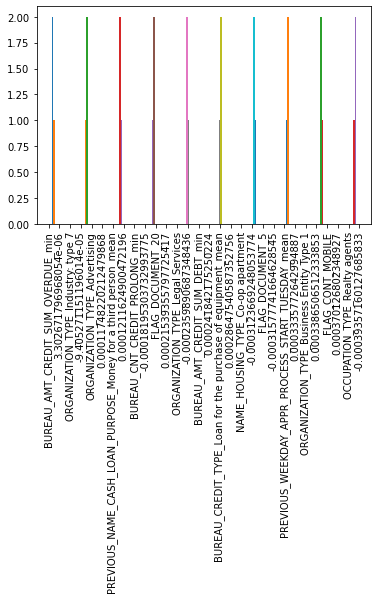

In [0]:
corrs=[]
for col in app.columns:
    # Calculate correlation with the target
    cor = app['TARGET'].corr(app[col])
    
    # Append the list as a tuple
    corrs.append((col, cor))
corrs = sorted(corrs, key = lambda x: abs(x[1]))
plt.hist(corrs[:15])
plt.xticks(rotation=90);

In [0]:
#Dropping columns with negligible correlation with the target
app=app.drop(columns=["BUREAU_AMT_CREDIT_SUM_OVERDUE_min","ORGANIZATION_TYPE_Industry: type 7"])

In [48]:
app.shape #check shape of final merged dataframe

(307511, 1314)

## **Checking for Multi-Collinearity**

In [0]:
#Create sample application dataframe to generate correlation matrix
app_sample=app.sample(frac=0.4)

In [0]:
#Generating correlation matrix
corr_matrix = app_sample.corr()

In [51]:
#List of columns with high multi-collinearity
correlation_threshold=0.99
top = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k = 1).astype(np.bool))
high_corr_cols = [col for col in top.columns if any(top[col].abs() > correlation_threshold)]
len(high_corr_cols)

359

In [0]:
#Dropping highly multi-collinear columns
app=app.drop(columns=high_corr_cols)

In [0]:
#Saving final dataset
app.to_csv("appDF_final3.csv")

In [0]:
!cp appDF_final3.csv drive/My\ Drive

In [0]:
#Loading final dataset
app=pd.read_csv('drive/My Drive/appDF_final3.csv')

In [56]:
app.head() #view head

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,...,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_CURRENT_mean_min,CC_CLIENT_CC_LOAN_CNT_INSTALMENT_MATURE_CUM_min_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_OTHER_CURRENT_min_count,CC_CLIENT_CC_LOAN_OVER_LIMIT_sum_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_max_sum,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_sum_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_CURRENT_max_min,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_CURRENT_sum_min,CC_CLIENT_CC_LOAN_CNT_INSTALMENT_MATURE_CUM_mean_min,CC_CLIENT_CC_LOAN_CNT_INSTALMENT_MATURE_CUM_max_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_count_min,CC_CLIENT_CC_LOAN_CNT_INSTALMENT_MATURE_CUM_sum_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_mean_sum,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_mean_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_TOTAL_CURRENT_mean_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_mean_sum,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_max_min,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_mean_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_TOTAL_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_max_sum,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_CURRENT_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_ATM_CURRENT_sum_min,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_max_min,CC_CLIENT_CC_LOAN_AMT_DRAWINGS_CURRENT_sum_min,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_sum_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_TOTAL_CURRENT_sum_min,CC_CLIENT_CC_LOAN_AMT_PAYMENT_CURRENT_sum_min,CC_CLIENT_CC_LOAN_AMT_RECEIVABLE_PRINCIPAL_sum_min,CC_CLIENT_CC_LOAN_BALANCE_CLEARED_mean_min,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Active_mean_min,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Active_mean_sum,CC_CLIENT_CC_LOAN_SK_DPD_min_count,CC_CLIENT_CC_LOAN_BALANCE_CLEARED_sum_min,CC_CLIENT_CC_LOAN_AMT_INST_MIN_REGULARITY_count_min,CC_CLIENT_CC_LOAN_AMT_BALANCE_count_min,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_min_min,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_mean_min,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_max_min,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_sum_min
0,100002,1.0,0.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,2.0,2.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0.0,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,NaN,1.0,1.0,0.0,1.0,1.0,0.0,2.0,1.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0.0,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,26.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,2.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0.0,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,-9833.0,-2437.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,17.0,0.0,0.0,0.0,0.0,0.0,0.

In [57]:
app.shape     #view updated shape

(307511, 956)

In [58]:
#Checking for columns with zero values
zero_cols=[i for i in app.columns if app[i].sum()==0]
zero_cols

['PREVIOUS_NAME_GOODS_CATEGORY_House Construction_mean',
 'PREVIOUS_NAME_GOODS_CATEGORY_House Construction_sum',
 'CASH_CLIENT_CASH_LOAN_NAME_CONTRACT_STATUS_XNA_mean_min',
 'CC_CLIENT_CC_LOAN_SK_DPD_min_mean']

In [0]:
#Dropping columns with zero values
app=app.drop(columns=zero_cols)

In [0]:
#Removing infinity values
app = app.replace([np.inf, -np.inf], np.nan)

## **Train Test Split**

In [0]:
msk = np.random.rand(len(app)) < 0.8

app_testm = app[~msk]

#Saving TARGET of test
app_testlabel = app_testm["TARGET"]

app1 = app[msk]
#app_trainlabel=app["TARGET"]

## **Undersampling TARGET value 0's due to high bias**

In [0]:
app_ones=app1[app1["TARGET"]==1]


app_zeros=app1[app1["TARGET"]==0]

#Undersampling 0's
app_zeros_sample=app_zeros.sample(frac=0.0881)
#Concatenating TARGET value 0's and 1's rows
app_new=pd.concat([app_ones,app_zeros_sample],join='outer')
#Shuffling rows
app_new=app_new.sample(frac=1)

app_trainlabel=app_new["TARGET"]

In [0]:
app_new=app_new.reset_index()

In [0]:
#Dropping primary ID and dependent variable from train
app_new=app_new.drop(["SK_ID_CURR","TARGET"],axis=1)

In [0]:
app_testm=app_testm.reset_index()

In [0]:
#Dropping primary ID and dependent variable from test
app_testm=app_testm.drop(["SK_ID_CURR","TARGET"],axis=1)

In [68]:
app_testm.shape #view shape

(61520, 950)

## **Imputing train and test**

In [0]:
# Median imputation of missing values
imputer = SimpleImputer(strategy = 'median', missing_values = np.nan)

# Fit on the train data
imputer.fit(app_new)

# Transform on train and test data
app_new = imputer.transform(app_new)
app_testm = imputer.transform(app_testm)


## **Scaling train and test**

In [0]:
# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range = (0, 1))

# Fit on the train data
scaler.fit(app_new)

# Transform on the train and test data
app_new = scaler.transform(app_new)
app_testm = scaler.transform(app_testm)

# **Modeling**
Baseline Accuracy is 50% - Equal number of Ones and Zeros Classes after Undersampling

## **K-Means algorithm Model**

In [71]:
Kmeans=KMeans(n_clusters=50,init="k-means++",max_iter=300,n_init=10,random_state=0) #build model
Kmeans.fit(app_new,app_trainlabel)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=50, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [0]:
predictions_kmeans_train=Kmeans.predict(app_new) #make predictions

In [0]:
XY=pd.DataFrame({"C":predictions_kmeans_train,"Y":app_trainlabel})

In [0]:
def cut_mode(x): #custom function to compute for a cut-off
    if x.mean() > 0.5:
      return 1
    else:
      return 0

XY_frame=XY.groupby("C").agg(cut_mode)

In [0]:
predictions_kmeans=Kmeans.predict(app_testm) #make predictions on test

In [76]:
test_p=[XY_frame.loc[i] for i in predictions_kmeans]
confusion_matrix(app_testlabel,test_p),accuracy_score(app_testlabel,test_p) #compute confusion matrix

(array([[31315, 25356],
        [ 1873,  2976]]), 0.5573959687906372)

In [77]:
precision_recall_fscore_support(app_testlabel,test_p) #compute metrics

(array([0.94356394, 0.10504024]),
 array([0.55257539, 0.61373479]),
 array([0.69698083, 0.17937977]),
 array([56671,  4849]))

### Accuracy: 55.73%

### True Positive Rate: 61.37%

## **Logistic Regression Model**

In [78]:
logreg = LogisticRegressionCV(Cs=20, cv=3) #build the model with cross validation approach
logreg.fit(app_new, app_trainlabel)
predictions_log = logreg.predict_proba(app_testm)[:, 1]

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/lin

In [0]:
predictions_log = np.where(predictions_log <= 0.5,0,1) #set cutoff

In [80]:
confusion_matrix(app_testlabel,predictions_log),accuracy_score(app_testlabel,predictions_log) #compute confusion matrix

(array([[39876, 16795],
        [ 1458,  3391]]), 0.7032997399219766)

In [81]:
precision_recall_fscore_support(app_testlabel,predictions_log) #compute metrics

(array([0.96472638, 0.16798771]),
 array([0.70364031, 0.69931945]),
 array([0.8137544 , 0.27090074]),
 array([56671,  4849]))

### Accuracy: 70.32%

### True Positive Rate: 69.93%

## **Principal Component Analysis**

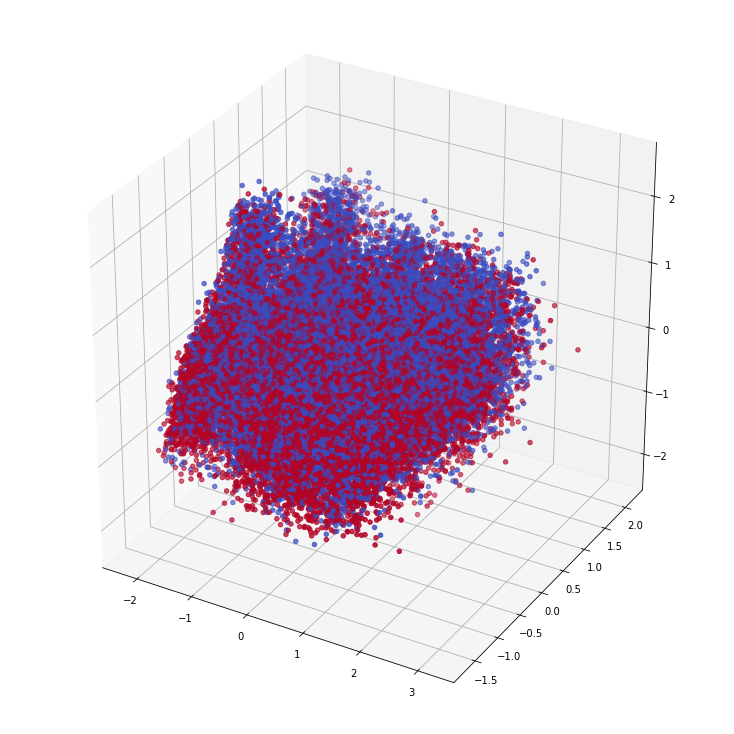

In [82]:
pca = PCA(n_components=3)
reduction = pca.fit_transform(app_new)

fig = pyplot.figure(figsize=(10,10))
ax = Axes3D(fig)
#take = 10000
ax.scatter(reduction[:,0], reduction[:,1], reduction[:,2],c = app_trainlabel,cmap = "coolwarm")

## **Neural Networks Model**

In [99]:
shape_in = app_new.shape[1] 
shape_in #check shape of dataframe to set the input_shape in 1st Convolutional Layer

950

In [0]:
app_new1 = np.expand_dims(app_new, 2)
app_testm1 = np.expand_dims(app_testm, 2)

In [102]:

#build model with many convolution and dense layers
model = tf.keras.Sequential([
      
        #Conv1D
        tf.keras.layers.Convolution1D(128, kernel_size=5,strides=1, activation='relu',batch_input_shape=(None,shape_in ,1), kernel_initializer=keras.initializers.glorot_normal()), #give shape
        # BatchNormalization
        keras.layers.BatchNormalization(),
        #Conv1D
        tf.keras.layers.Convolution1D(64, kernel_size=5,strides=1, activation='relu',kernel_initializer=keras.initializers.glorot_normal()), 
        # BatchNormalization
        keras.layers.BatchNormalization(),
        # 1D Maxpooling
        tf.keras.layers.MaxPooling1D(pool_size=2, strides=1),
        #Conv1D
        tf.keras.layers.Convolution1D(32, kernel_size=5,strides=1, activation='relu',kernel_initializer=keras.initializers.glorot_normal()), 
        # BatchNormalization
        keras.layers.BatchNormalization(),
        #Flatten
        tf.keras.layers.Flatten(),
        #Input layer
        tf.keras.layers.Dense(units=256, activation='relu',kernel_initializer=keras.initializers.glorot_normal()),
        tf.keras.layers.Dropout(0.2), #to avoid overfitting
        #Hidden layer I
        tf.keras.layers.Dense(128, activation='relu',kernel_initializer=keras.initializers.glorot_normal()),
        tf.keras.layers.Dropout(0.2), #to avoid overfitting
        #Ouput Layer
        tf.keras.layers.Dense(1, activation='sigmoid') #activation function to output probabilities '1' or '0'
])

# Compile Model
model.compile(loss = 'binary_crossentropy', optimizer="adam", metrics=['acc','Recall']) #Gradient descent with adaptive learning rate
# Print Model Summary 
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 946, 128)          768       
_________________________________________________________________
batch_normalization (BatchNo (None, 946, 128)          512       
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 942, 64)           41024     
_________________________________________________________________
batch_normalization_1 (Batch (None, 942, 64)           256       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 941, 64)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 937, 32)           10272     
_________________________________________________________________
batch_normalization_2 (Batch (None, 937, 32)           1

In [103]:
#set no. of iterations
epoch = 10

filepath="weights.hdf5"
checkpointer = ModelCheckpoint(filepath=filepath,monitor = "val_acc", verbose=1, save_best_only=True)
#fit model on train data
history = model.fit(app_new1, app_trainlabel,batch_size=32,epochs=epoch,validation_data=(app_testm1, app_testlabel),callbacks=[checkpointer])

#evaluate metrics on test data
preds_DNN=model.evaluate(app_testm1, app_testlabel)

Epoch 1/10
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
1247/1247 [==============================] - ETA: 0s - loss: 0.7299 - acc: 0.5498 - recall: 0.6861
Epoch 00001: val_acc improved from -inf to 0.65013, saving model to weights.hdf5
1247/1247 [==============================] - 53s 42ms/step - loss: 0.7299 - acc: 0.5498 - recall: 0.6861 - val_loss: 0.5446 - val_acc: 0.6501 - val_recall: 0.7247
Epoch 2/10
1245/1247 [============================>.] - ETA: 0s - loss: 0.6334 - acc: 0.6471 - recall: 0.7761
Epoch 00002: val_acc improved from 0.65013 to 0.68249, saving model to weights.hdf5
1247/1247 [==============================] - 53s 42ms/step - loss: 0.6334 - acc: 0.6470 - recall: 0.7759 - val_loss: 0.6351 - val_acc: 0.6825 - val_recall: 0.7039
Epoch 3/10
1245/1247 [============================>.] - ETA: 0s - loss: 0.6082 - acc: 0.6604 - recall: 0.7754
Epoch 00003: val_acc did not improve from 0.68249
1247/1247 [==============================] - 52s

In [104]:
preds_DNN #validation loss, accuracy and Recall (TPR)

[0.5741485953330994, 0.6855819225311279, 0.7127242684364319]

In [0]:
preds=model.predict(app_testm1) #make predictions
predictions_nn = np.where(preds <= 0.5,0,1).flatten() #set cut-off

In [106]:
#compute confusion matrix
confusion_matrix(np.array(app_testlabel).astype(int),predictions_nn.astype(int)),accuracy_score(np.array(app_testlabel).astype(int),predictions_nn.astype(int))

(array([[38721, 17950],
        [ 1393,  3456]]), 0.6855819245773732)

In [107]:
precision_recall_fscore_support(np.array(app_testlabel).astype(int),predictions_nn.astype(int)) #compute metrics

(array([0.96527397, 0.16145006]),
 array([0.68325952, 0.71272427]),
 array([0.80014465, 0.26326414]),
 array([56671,  4849]))

### Accuracy: 68.55%

### True Positive Rate: 71.27%

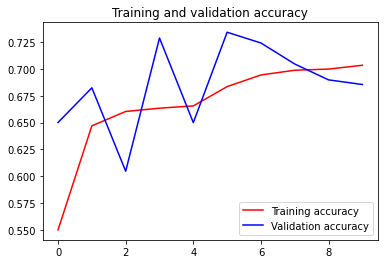

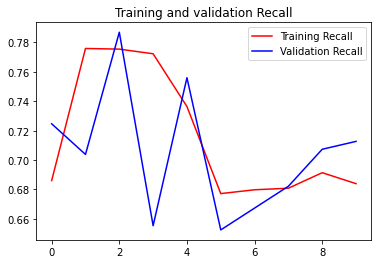

In [108]:
# Plot the chart for accuracy and recall on both training and validation

import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['recall']
val_loss = history.history['val_recall']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Recall')
plt.plot(epochs, val_loss, 'b', label='Validation Recall')
plt.title('Training and validation Recall')
plt.legend()

plt.show()

## **Random Forest Model**

In [83]:
rf = RandomForestClassifier(n_estimators = 500,max_depth=100, n_jobs = -1, verbose = 1) #build model with hyperparameters
rf.fit(app_new, app_trainlabel)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.3min finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=100, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=1,
                       warm_start=False)

In [84]:
rf_predictions=rf.predict(app_testm) #predict on test data

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    5.3s finished


In [0]:
predictions_rf_test = np.where(rf_predictions <= 0.6,0,1) #set cut-off value

In [86]:
confusion_matrix(app_testlabel,predictions_rf_test),accuracy_score(app_testlabel,predictions_rf_test) #confusion matrix

(array([[39090, 17581],
        [ 1436,  3413]]), 0.6908810143042913)

In [87]:
precision_recall_fscore_support(app_testlabel,predictions_rf_test) #compute metrics

(array([0.96456596, 0.16257026]),
 array([0.68977078, 0.70385647]),
 array([0.80434581, 0.26413342]),
 array([56671,  4849]))

### Accuracy: 69.08%

### True Positive Rate: 70.38%

## **XGBoost Model**

In [88]:
model_xg = XGBClassifier(eta=0.1,n_estimators=500,max_depth=10) #build model with hyperparameters
model_xg.fit(app_new, app_trainlabel)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=None, n_estimators=500, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [0]:
y_predm = model_xg.predict(app_testm) #predict on test set

In [90]:
confusion_matrix(app_testlabel,y_predm),accuracy_score(app_testlabel,y_predm) #compute confusion matrix

(array([[39954, 16717],
        [ 1449,  3400]]), 0.7047139141742522)

In [91]:
precision_recall_fscore_support(app_testlabel,y_predm) #compute metrics

(array([0.96500254, 0.16901128]),
 array([0.70501668, 0.7011755 ]),
 array([0.81477252, 0.27237042]),
 array([56671,  4849]))

### Accuracy: 70.47%

### True Positive Rate: 70.11%

### **XGBoost Feature Importances**

In [92]:
#Extracing feature strengths
feature_imp=pd.DataFrame(model_xg.feature_importances_)
feature_imp

,0
0,0.001088
1,0.000999
2,0.001359
3,0.001553
4,0.001625
...,...
945,0.001627
946,0.001133
947,0.001466
948,0.001129


In [93]:
#Extracting features
features=pd.DataFrame(app.columns)
features=features.drop(0)
features=features.reset_index(drop=True)
features

,0
0,TARGET
1,CNT_CHILDREN
2,AMT_INCOME_TOTAL
3,AMT_CREDIT
4,AMT_ANNUITY
...,...
946,CC_CLIENT_CC_LOAN_AMT_BALANCE_count_min
947,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_min_min
948,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_mean...
949,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_max_min


In [94]:
#Merging features and their strengths
features['features']=features[0]

features=features.drop(0,axis=1)

feat=pd.concat([features,feature_imp],axis=1)

feat

,features,0
0,TARGET,0.001088
1,CNT_CHILDREN,0.000999
2,AMT_INCOME_TOTAL,0.001359
3,AMT_CREDIT,0.001553
4,AMT_ANNUITY,0.001625
...,...,...
946,CC_CLIENT_CC_LOAN_AMT_BALANCE_count_min,0.001133
947,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_min_min,0.001466
948,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_mean...,0.001129
949,CC_CLIENT_CC_LOAN_AMT_CREDIT_LIMIT_ACTUAL_max_min,0.001400


,features,0
94,EXT_SOURCE_SUM,0.012435
876,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Sent pr...,0.005522
116,NAME_EDUCATION_TYPE_Academic degree,0.004397
908,CC_CLIENT_CC_LOAN_NAME_CONTRACT_STATUS_Complet...,0.004031
489,PREVIOUS_NFLAG_INSURED_ON_APPROVAL_min,0.003984
910,CC_CLIENT_CC_LOAN_CNT_DRAWINGS_ATM_CURRENT_mea...,0.003861
442,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Urgent needs_sum,0.003712
441,PREVIOUS_NAME_CASH_LOAN_PURPOSE_Urgent needs_mean,0.003669
321,BB_CLIENT_BB_LOAN_STATUS_3_mean_sum,0.003519
694,IN_CLIENT_IN_LOAN_LOW_PAYMENT_sum_sum,0.003400


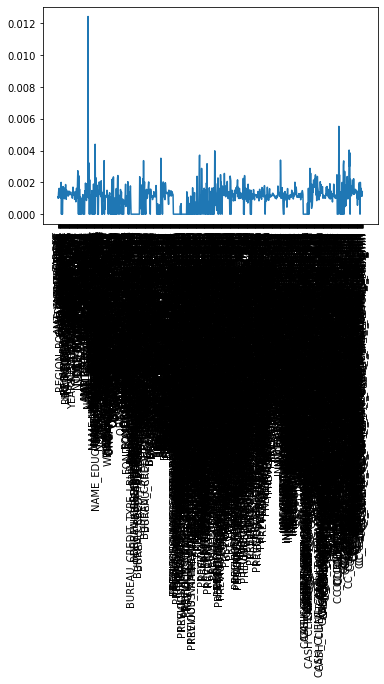

In [95]:
#Plotting feature importances and displaying top features in table
plt.plot(feat["features"],feat[0])
plt.xticks(rotation=90);
feat.sort_values(by=0,ascending=False).head(10)

As seen from the above graph and table, EXT_SOURCE features are very important

# **Conclusion**

The XGBoost Model and the Logistic Regression models were the best performing models keeping both accuracy and True positive rate in mind. Our aim was to not have many false negatives i.e. predicting defaulters as non-defaulters which would bring great loss to the firm.
Hence, high True positive rate was desired keeping a decent accuracy figure.
Finally we choose XGBoost Model for predictions since it is less likely to overfit and does automatic feature selection.